In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# from huggingface_hub import notebook_login

# notebook_login()

In [2]:
from subprocess import getoutput
from IPython.display import HTML
from IPython.display import clear_output
import time
import matplotlib.pyplot as plt
import sys
import os
import glob
import mimetypes
from pathlib import Path
import PIL
import gc
import transformers
import diffusers
import itertools
import torch

sys.path.append("..")

In [3]:
def get_extensions_for_type(general_type):
    for ext in mimetypes.types_map:
        if mimetypes.types_map[ext].split('/')[0] == general_type:
            yield ext

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def load_image(path):
    return PIL.Image.open(path).convert("RGB")

IMG_EXTS = set(get_extensions_for_type('image'))

In [4]:
def get_shapshot_name(path):
    return path.name if isinstance(path, Path) else path.split('/')[-1]

In [5]:
pretrained_model_name_or_path = "stabilityai/stable-diffusion-2" #@param ["stabilityai/stable-diffusion-2", "stabilityai/stable-diffusion-2-base", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"] {allow-input: true}

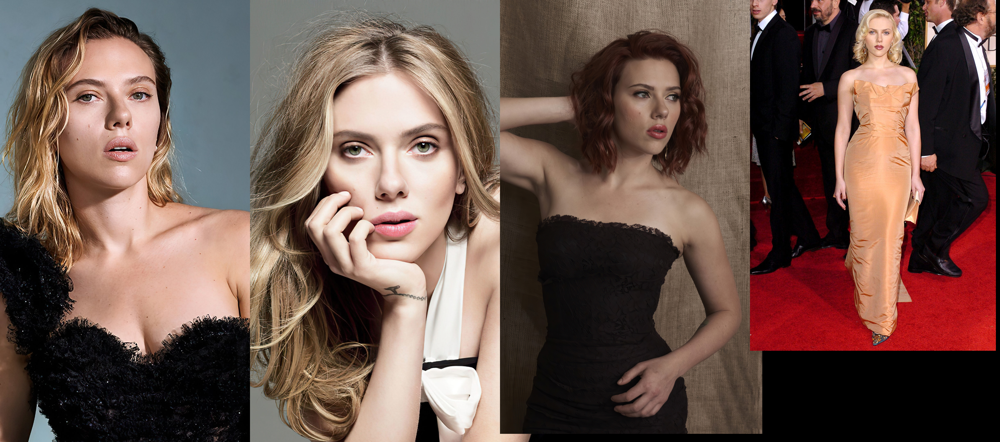

In [6]:
instance_path = Path("../data/scarlett")
assert instance_path.exists()

images = list(
    filter(None, [
        load_image(img_path)
        for img_path in instance_path.rglob("*")
        if img_path.suffix in IMG_EXTS
    ])
)

num_samples = min(max(len(images), 10), 4)
image_grid(images[:num_samples], rows=1, cols=num_samples)

In [7]:
finetune_type = "textual_inversion" #"dreambooth"

In [8]:
placeholder_token = "<sks>"
initializer_token = "woman"
instance_prompt = f"a photo of a {placeholder_token} {initializer_token}"

prior_preservation = False
prior_preservation_class_prompt = f"a photo of a {initializer_token}"

num_class_images = 20
sample_batch_size = 2
prior_loss_weight = 0.5
prior_preservation_class_folder = "../data/class_images"
class_data_root=prior_preservation_class_folder
class_prompt=prior_preservation_class_prompt

In [9]:
text_encoder = transformers.CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder"
)
vae = diffusers.AutoencoderKL.from_pretrained(
    pretrained_model_name_or_path, subfolder="vae"
)
unet = diffusers.UNet2DConditionModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="unet"
)
tokenizer = transformers.CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer",
)

In [10]:
from utils import dreambooth, textual_inversion


if finetune_type == "dreambooth":
    # prior preservation
    dreambooth.generate_class_images(
        prior_preservation,
        class_data_root, 
        num_class_images,
        pretrained_model_name_or_path,
        class_prompt,
        sample_batch_size
    )

    training_function = dreambooth.training_function

elif finetune_type == "textual_inversion":
    print(len(tokenizer))
    num_added_tokens = tokenizer.add_tokens(placeholder_token)
    if num_added_tokens == 0:
        raise ValueError(
            f"The tokenizer already contains the token {placeholder_token}. Please pass a different"
            " `placeholder_token` that is not already in the tokenizer."
        )
    token_ids = tokenizer.encode(initializer_token, add_special_tokens=False)
    if len(token_ids) > 1:
        raise ValueError("The initializer token must be a single token.")

    initializer_token_id = token_ids[0]
    placeholder_token_id = tokenizer.convert_tokens_to_ids(placeholder_token)

    text_encoder.resize_token_embeddings(len(tokenizer))
    print(len(tokenizer))

    # fill the newly added placeholder token with the embeddings of the initializer token
    token_embeds = text_encoder.get_input_embeddings().weight.data
    token_embeds[placeholder_token_id] = token_embeds[initializer_token_id]

    training_function = textual_inversion.training_function
else:
    raise NotImplementedError(f"Finetuning {finetune_type} is not available")

49408
49409


In [11]:
task_name = ""

output_dir_parts = [
    get_shapshot_name(pretrained_model_name_or_path),
    get_shapshot_name(instance_path),
    task_name
]

output_dir_parts = [part for part in output_dir_parts if part]
output_dir = "-".join(output_dir_parts)

In [15]:
from argparse import Namespace

args = Namespace(
    pretrained_model_name_or_path=pretrained_model_name_or_path,
    resolution=vae.sample_size,
    center_crop=True,
    train_text_encoder=True,
    instance_data_dir=instance_path,
    instance_prompt=instance_prompt,
    learning_rate=5e-06,
    max_train_steps=800,
    save_steps=100,
    train_batch_size=2 if not prior_preservation else 1, # set to 1 if using prior preservation
    gradient_accumulation_steps=2,
    max_grad_norm=1.0,
    mixed_precision="fp16", # set to "fp16" for mixed-precision training.
    gradient_checkpointing=True, # set this to True to lower the memory usage.
    use_8bit_adam=True, # use 8bit optimizer from bitsandbytes
    seed=3434554,
    with_prior_preservation=prior_preservation,
    prior_loss_weight=prior_loss_weight,
    sample_batch_size=2,
    class_data_dir=prior_preservation_class_folder,
    class_prompt=prior_preservation_class_prompt,
    num_class_images=num_class_images,
    lr_scheduler="constant",
    lr_warmup_steps=100,
    output_dir=output_dir,
    placeholder_token=placeholder_token,
    placeholder_token_id=placeholder_token_id,
    scale_lr=True,
    repeats=100,
    property='object',
)

C:\Users\Alexey\AppData\Local\Temp\ipykernel_12464\93886530.py:5: FutureWarning: Accessing config attribute `sample_size` directly via 'AutoencoderKL' object attribute is deprecated. Please access 'sample_size' over 'AutoencoderKL's config object instead, e.g. 'unet.config.sample_size'.
  resolution=vae.sample_size,


In [26]:
# train_dataset = textual_inversion.TextualInversionDataset(
#         instance_data_root=args.instance_data_dir,
#         tokenizer=tokenizer,
#         learnable_property=args.property, #Option selected above between object and style
#         size=vae.sample_size,
#         repeats=args.repeats,
#         set="train",
#         placeholder_token=args.placeholder_token,
#         center_crop=args.center_crop,
#     )

In [27]:
# train_dataset[0]

In [28]:
#@title Run training
import accelerate

num_of_gpus = 1  # CHANGE THIS TO MATCH THE NUMBER OF GPUS YOU HAVE

accelerate.notebook_launcher(training_function, args=(args, text_encoder, vae, unet, tokenizer), num_processes=num_of_gpus)
for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
  if param.grad is not None:
    del param.grad  # free some memory
  torch.cuda.empty_cache()

Launching training on one GPU.


c:\Users\Alexey\Documents\github\diploma_faceswap\training\notebooks\..\utils\textual_inversion\training.py:37: FutureWarning: Accessing config attribute `sample_size` directly via 'AutoencoderKL' object attribute is deprecated. Please access 'sample_size' over 'AutoencoderKL's config object instead, e.g. 'unet.config.sample_size'.
  size=vae.sample_size,
C:\Users\Alexey\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\diffusers\configuration_utils.py:244: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
Steps:   0%|          | 0/8

TypeError: 'Namespace' object is not subscriptable